
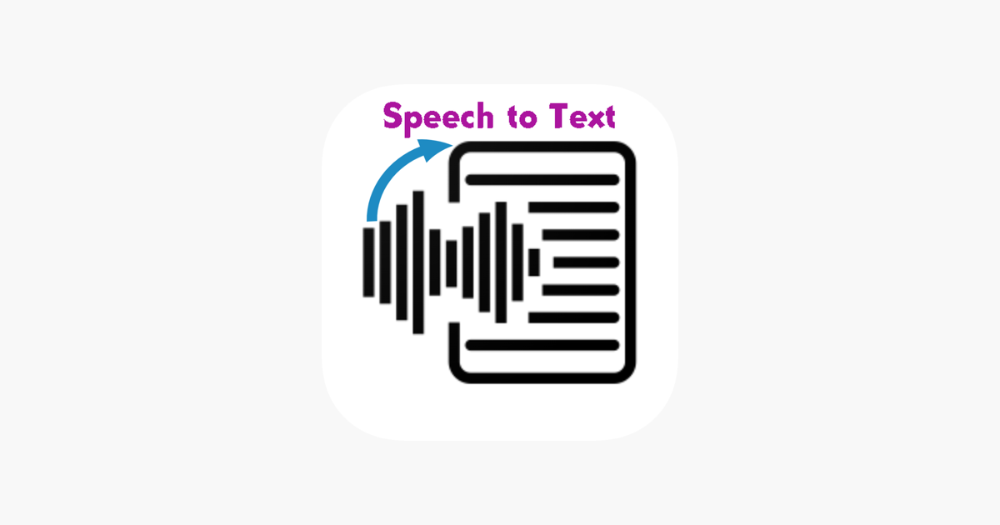



In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


This task is aimed to prepare you for the work defined for the
Speech-To-Text team. As a member of this team, you would primarily be involved in modifying existing speech-to-text models to be suitable for Ghanaian-accented English and building effective pipelines to evaluate these models.<br>

---


*CHALLENGE*<br>
Your task today would be that of transcribing an audio sample of your choice with a speech-to-text model and then measure up the model's transcription performance with the use of standard speech-transcription metric(s).


---



*GUIDELINES* <br>


1.   Be sure to use an open-source speech-to-text model. Making API calls to closed source software automatically rules out your application.
2.   Provide a one-page write-up on your work explaining your model, audio and evaluation metric(s) choice selection, with a description of your executed steps.



**ALL THE BEST AND HAPPY CODING!**




# **Import** **Necessary** **Libraries**

In [ ]:
import pandas as pd
import numpy as np
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
import matplotlib.pyplot as plt
from IPython import display



In [ ]:
!pip install -U openai-whisper


     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 798.6/798.6 kB 12.3 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl.metadata (1.5 kB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl.metadata (1.6 kB)
  Using cached nvidia_cuspa

In [ ]:
import whisper
import time
import librosa
import re
import os
import soundfile as sf

In [ ]:
import seaborn as sns
from glob import glob
import matplotlib.pyplot as plt
import librosa.display
import IPython.display as ipd
from IPython.display import display

In [ ]:
from IPython.display import Audio

# Path to the audio file
audio_file_path = "/content/drive/MyDrive/Colab Notebooks/truthaboutcongo_01_starr_128kb.mp3"

# Play the audio file
Audio(audio_file_path)


In [ ]:
!pip install -U openai-whisper
!pip install torch


In [ ]:


# Load the Whisper model
model = whisper.load_model("tiny")

audio_path = "/content/drive/MyDrive/Colab Notebooks/truthaboutcongo_01_starr_128kb.mp3"

# Transcribe the audio
result = model.transcribe(audio_path, language="en")

# Print the transcription
print("Transcription:", result['text'])


100%|█████████████████████████████████████| 72.1M/72.1M [00:01<00:00, 69.7MiB/s]
/usr/local/lib/python3.10/dist-packages/whisper/transcribe.py:115: UserWarning: FP16 is not supported on CPU; using FP32 instead
  warnings.warn("FP16 is not supported on CPU; using FP32 instead")


Transcription:  Section 1 of the Truth About the Congo. This is a Librebox recording. All Librebox recordings are in the public domain. For more information or to volunteer, please visit librebox.org. Read by Mario Pineda. The Truths About the Congo by Frederik Star. Preface 1 Part 1 Preface. When I returned to America, I had decided to express an opinion upon the public and political questions of the Congo Free State. Having found conditions there are quite different from what I had expected. It was impossible for me to state my actual impressions without danger of antagonizing or offending some whom I valued as friends. Hence, on landing at New York, I refused to say anything upon this matters to several reporters who interviewed me. A little later, Nichika Gutribion asked me to write upon this subjects, urging the importance of the whole matter to our nation and leaving me entire freedom in viewpoint and mode of treatment. In response to its request, I prepared a series of articles 

In [ ]:
if "text" in result:
    # Get the transcription text
    transcription_text = result["text"]

    # Path to save the transcription file
    transcription_file_path = "/content/drive/MyDrive/Colab Notebooks/transcription.txt"

    # Write the transcription text to the file
    with open(transcription_file_path, "w") as file:
        file.write(transcription_text)

    print(f"Transcription saved to {transcription_file_path}")
else:
    print("Transcription failed. Please check the audio file and model.")

Transcription saved to /content/drive/MyDrive/Colab Notebooks/transcription.txt


In [ ]:
!pip install jiwer
import jiwer

In [ ]:
# Paths to the transcription and reference files
transcription_file_path = "/content/drive/MyDrive/Colab Notebooks/transcription.txt"
reference_file_path = "/content/drive/MyDrive/Colab Notebooks/Congo_file.txt"
# Read the transcription text
with open(transcription_file_path, "r") as file:
    transcription_text = file.read().strip()

# Read the reference text (ground truth)
with open(reference_file_path, "r") as file:
    reference_text = file.read().strip()

# Compute WER
wer = jiwer.wer(reference_text, transcription_text)

print(f"Word Error Rate (WER): {wer:.4f}")


Word Error Rate (WER): 0.0093
